In [ ]:
# Import libraries
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
import numpy as np
import os
import cv2

In [ ]:
pip install kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"aanchalsharma19","key":"3af773c8a9239c9d7e77b5357e759033"}'}

In [ ]:
!mkdir -p /root/.kaggle
!cp kaggle.json /root/.kaggle/

In [ ]:
# Download dataset
!kaggle datasets download -d mohammadamireshraghi/blood-cell-cancer-all-4class


 99% 1.66G/1.68G [00:16<00:00, 134MB/s]
100% 1.68G/1.68G [00:16<00:00, 107MB/s]


In [ ]:
import zipfile

In [ ]:
zip_file_path = '/content/blood-cell-cancer-all-4class.zip'

In [ ]:
zip_ref = zipfile.ZipFile(zip_file_path, 'r')

In [ ]:
zip_ref.extractall()

In [ ]:
zip_ref.close()


In [ ]:
import os
import cv2
import numpy as np


In [ ]:
folder_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B'

In [ ]:
output_mask_dir = '/content/masks_preb'

In [ ]:
os.makedirs(output_mask_dir, exist_ok=True)

In [ ]:
for filename in os.listdir(folder_path):
    if filename.endswith(".jpg"):

        image_path = os.path.join(folder_path, filename)
        image = cv2.imread(image_path)


        grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


        _, binary_mask = cv2.threshold(grayscale_image, 128, 255, cv2.THRESH_BINARY)


        mask_filename = filename.replace(".jpg", "_mask.jpg")
        mask_path = os.path.join(output_mask_dir, mask_filename)
        cv2.imwrite(mask_path, binary_mask)

In [ ]:
print(f"Masks for {len(os.listdir(folder_path))} images created and saved in {output_mask_dir}.")

Masks for 955 images created and saved in /content/masks_preb.


In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Cropping2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

In [ ]:
image_dir = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B'
mask_dir = '/content/masks_preb'

In [ ]:
image_shapes = []
mask_shapes = []

In [ ]:
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg"):

        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)
        image_shapes.append(image.shape)

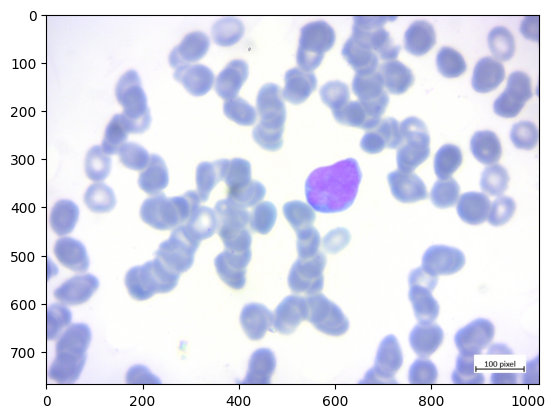

In [ ]:
import cv2
from skimage.io import imread
import matplotlib.pyplot as plt

path_image = "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_009.jpg"

image = imread(path_image)

plt.imshow(image)
plt.show()


# **Segmenting using pre-trained model**

In [ ]:
# Import necessary libraries
import torch
import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Load the pre-trained Mask R-CNN model
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
# Load an image
image_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_006.jpg'
image = Image.open(image_path)
image_tensor = F.to_tensor(image).unsqueeze(0)

In [ ]:
# Perform inference
with torch.no_grad():
    prediction = model(image_tensor)

In [ ]:
# Extract instance segmentation masks and bounding boxes
masks = prediction[0]['masks']
boxes = prediction[0]['boxes']

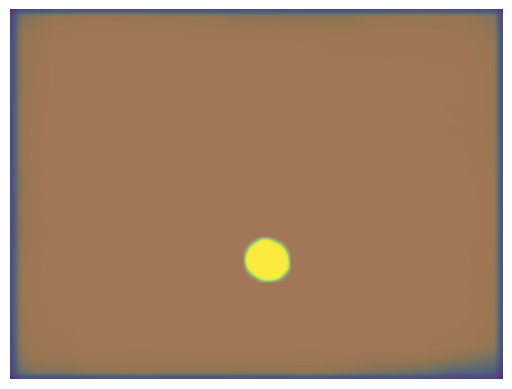

In [ ]:
# Visualize the results
image = np.array(image)
for i in range(masks.shape[0]):
    mask = masks[i, 0].mul(255).byte().cpu().numpy()
    x, y, w, h = boxes[i].cpu().numpy().astype(int)
    cv2.rectangle(image, (x, y), (w, h), (255, 0, 0), 2)  # Draw bounding box
    plt.imshow(mask, cmap='viridis', alpha=0.5)  # Overlay mask on the image

plt.axis('off')
plt.show()

**Implementing on the dataset**

In [ ]:
dataset_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/'

In [ ]:
image_files = [filename for filename in os.listdir(dataset_path) if filename.endswith(".jpg")]

In [ ]:
# Randomly select 10 images from the dataset
random_images = random.sample(image_files, 10)

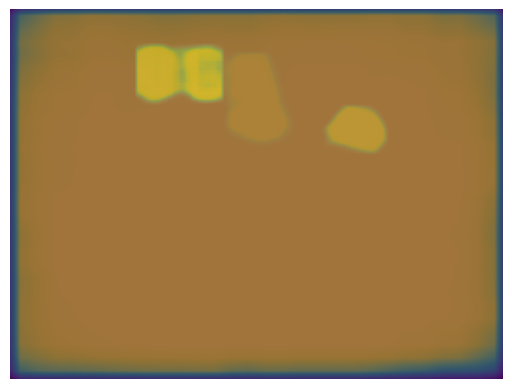

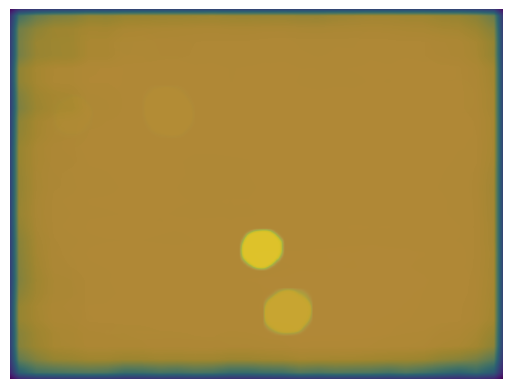

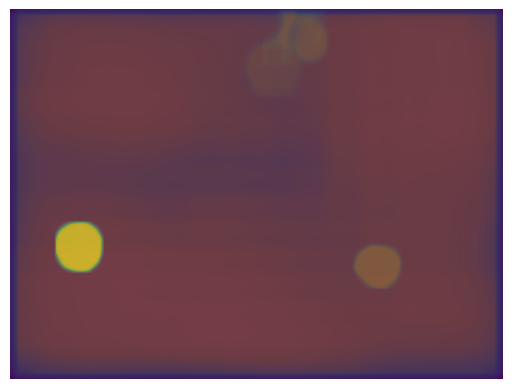

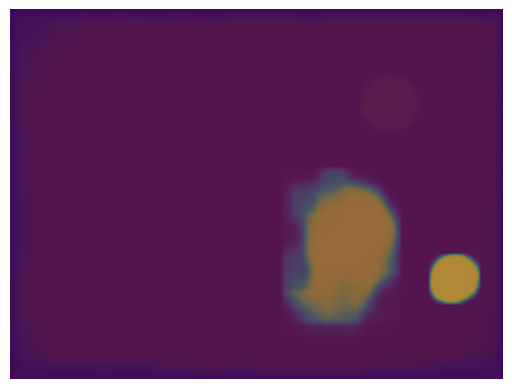

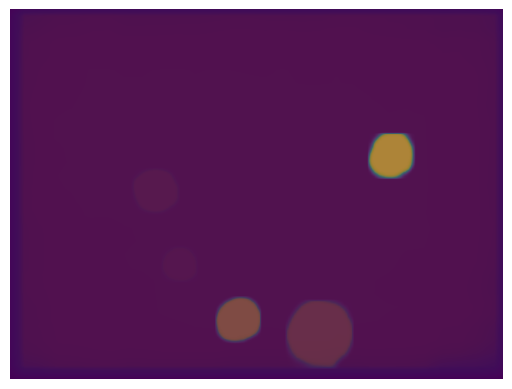

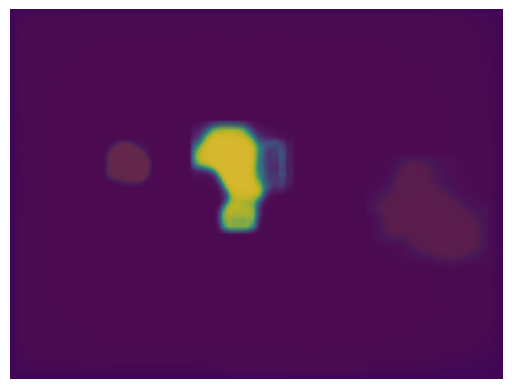

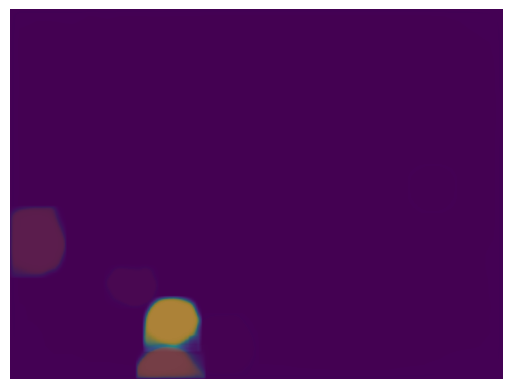

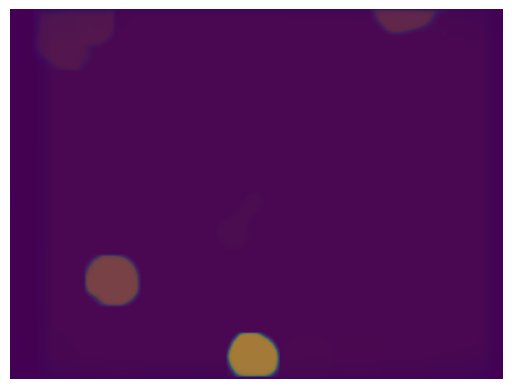

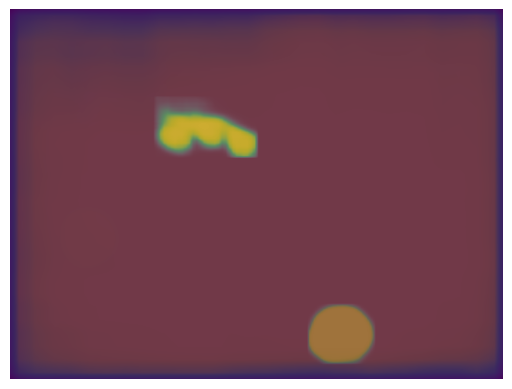

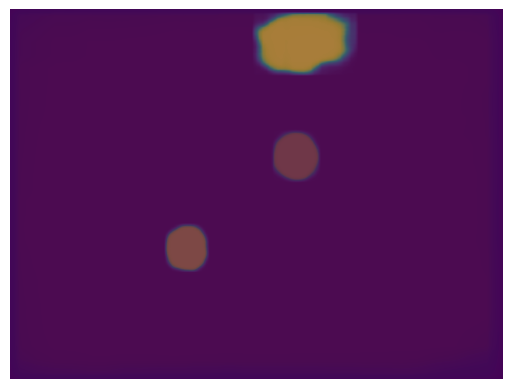

In [ ]:
# Iterate over the randomly selected images
for filename in random_images:
    image_path = os.path.join(dataset_path, filename)
    image = Image.open(image_path)
    image_tensor = F.to_tensor(image).unsqueeze(0)

    # Perform inference
    with torch.no_grad():
        prediction = model(image_tensor)

    # Extract instance segmentation masks and bounding boxes
    masks = prediction[0]['masks']
    boxes = prediction[0]['boxes']

    # Visualize the results
    image = np.array(image)
    for j in range(masks.shape[0]):
        mask = masks[j, 0].mul(255).byte().cpu().numpy()
        x, y, w, h = boxes[j].cpu().numpy().astype(int)
        cv2.rectangle(image, (x, y), (w, h), (255, 0, 0), 2)  # Draw bounding box
        plt.imshow(mask, cmap='viridis', alpha=0.5)  # Overlay mask on the image

    plt.axis('off')
    plt.show()


The segmentation used in the code is called instance segmentation, and it is based on deep learning. More specifically, the code utilizes the Mask R-CNN (Region-based Convolutional Neural Network) model, which is a popular deep learning architecture for instance segmentation tasks.


# **Thresholding** - **HSV**

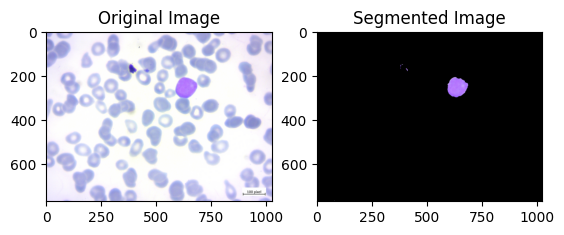

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_004.jpg"
image = cv2.imread(image_path)

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

lower_purple = np.array([130, 50, 50])
upper_purple = np.array([170, 255, 255])

# Create a mask based on the purple color thresholds
mask = cv2.inRange(hsv_image, lower_purple, upper_purple)

# Apply the mask to the original image
segmented_image = cv2.bitwise_and(image, image, mask=mask)

# Display the original and segmented images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title("Segmented Image")

plt.show()


# **Using GrabCut algorithm** - **Extracting foreground and background**

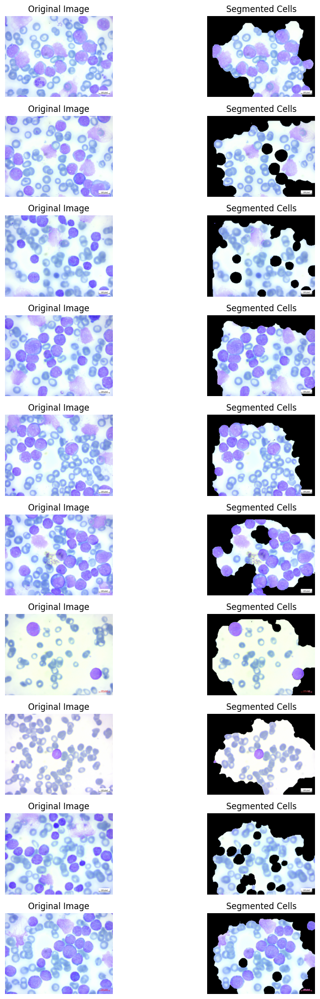

In [ ]:
import cv2
import os
import random
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt


dataset_path = "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/"


image_files = os.listdir(dataset_path)


random_images = random.sample(image_files, 10)


fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(10, 20))

for i, image_file in enumerate(random_images):

    image_path = os.path.join(dataset_path, image_file)
    image = cv2.imread(image_path)


    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    mask = np.zeros(image.shape[:2], np.uint8)

    roi = (50, 50, image.shape[1] - 50, image.shape[0] - 50)

    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    cv2.grabCut(image, mask, roi, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

    # Create a mask where the probable foreground and definite foreground
    # regions are set to 1, and the background regions are set to 0
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

    # Apply the mask to the original image to extract the segmented cells
    segmented = image * mask2[:, :, np.newaxis]

    # Display the original image and the segmented cells in the plot
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Segmented Cells")
    axes[i, 1].axis("off")


plt.tight_layout()


plt.show()


# **Using Watershed algorithm**

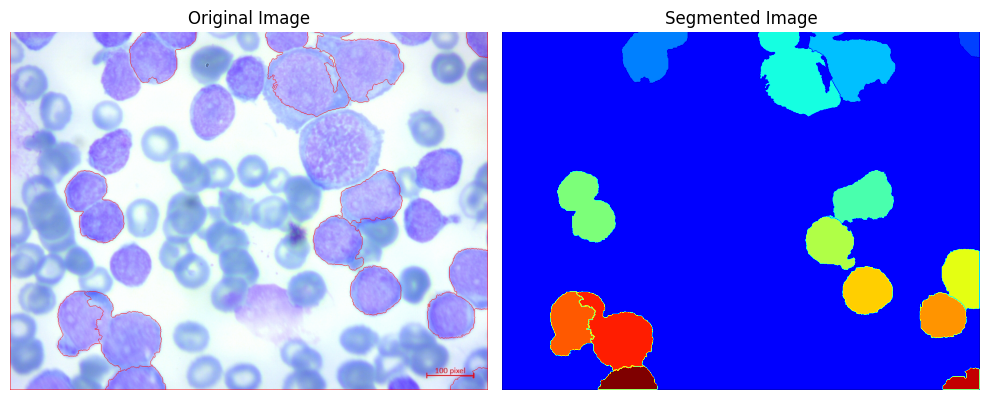

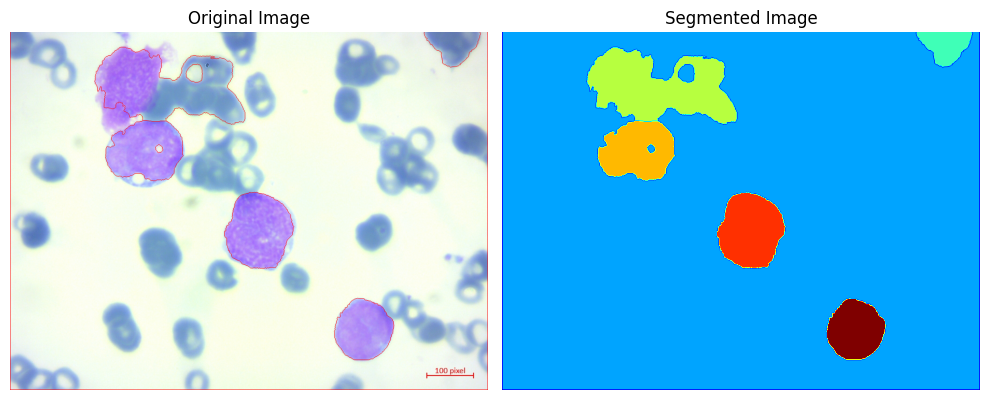

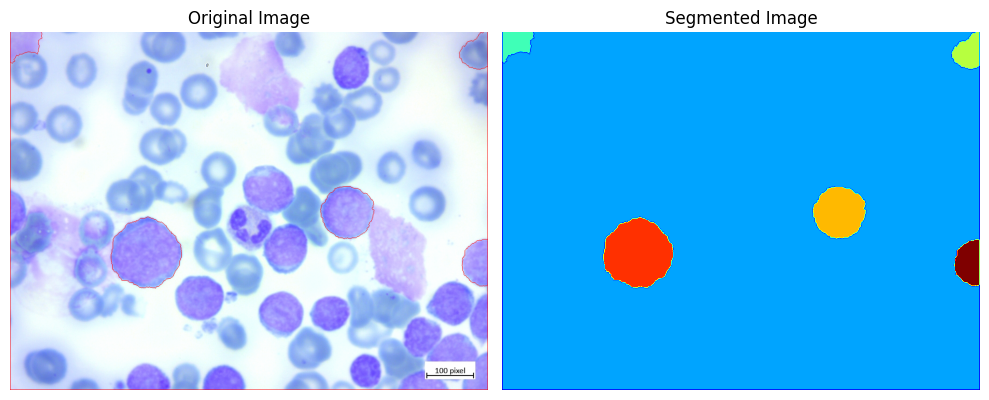

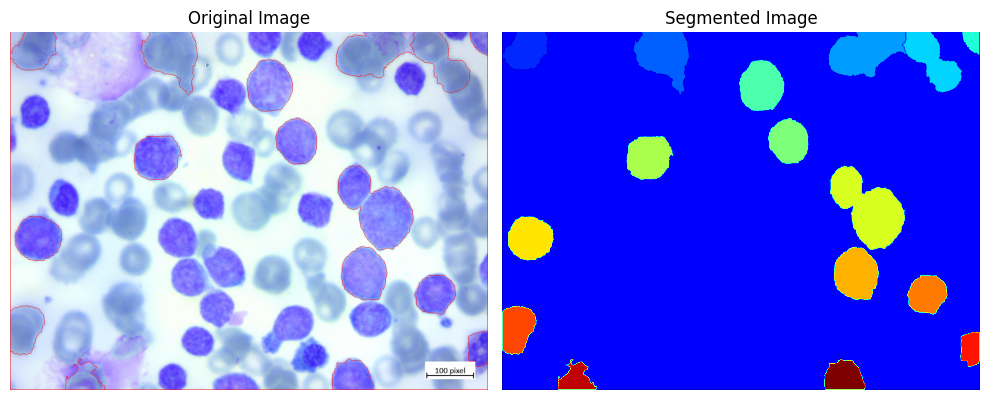

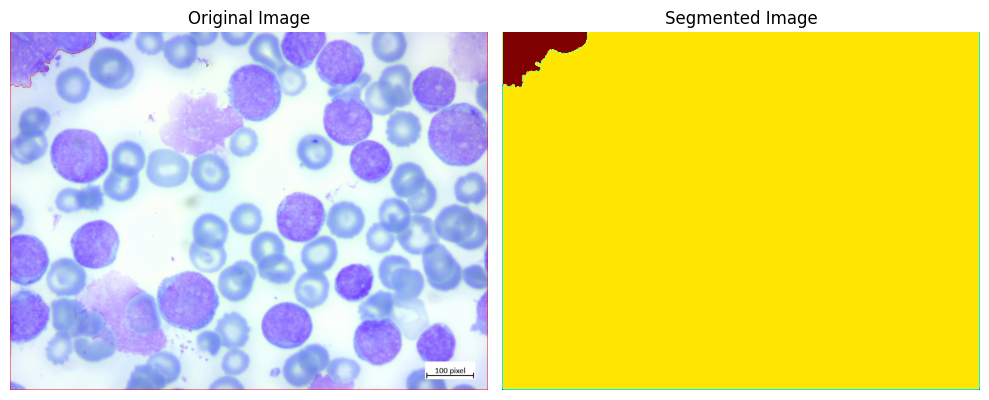

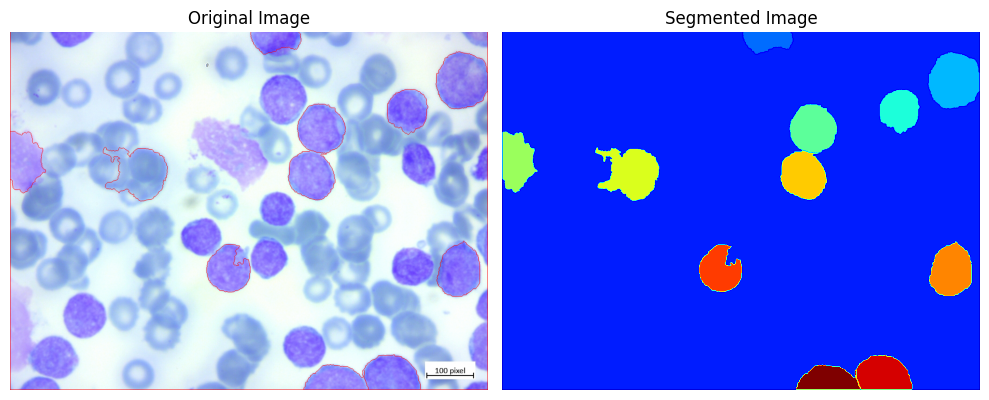

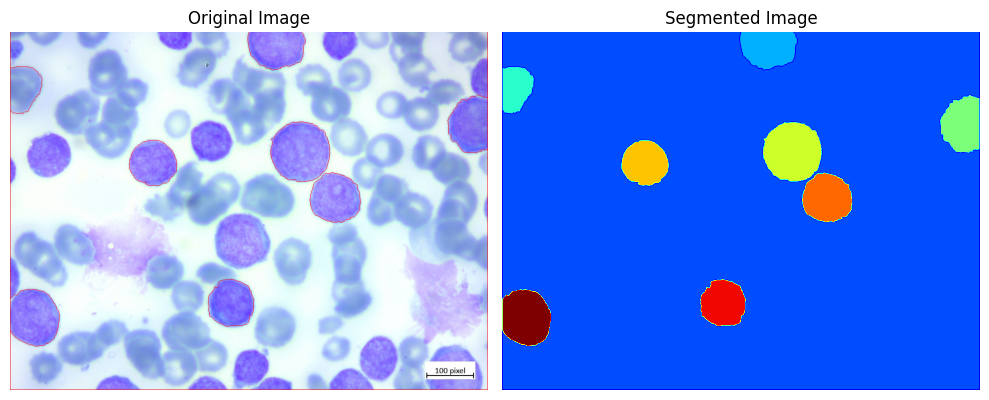

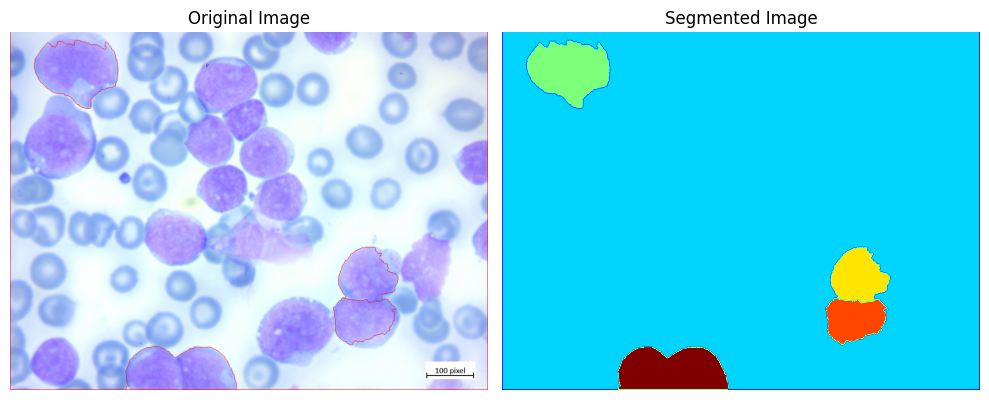

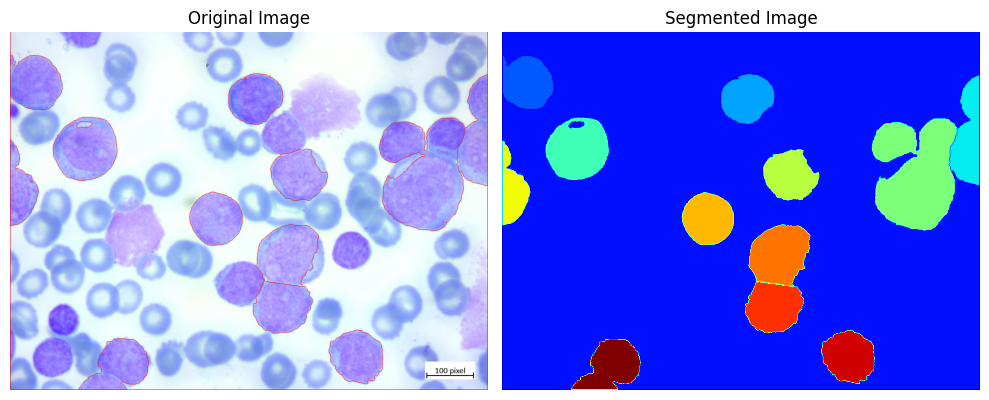

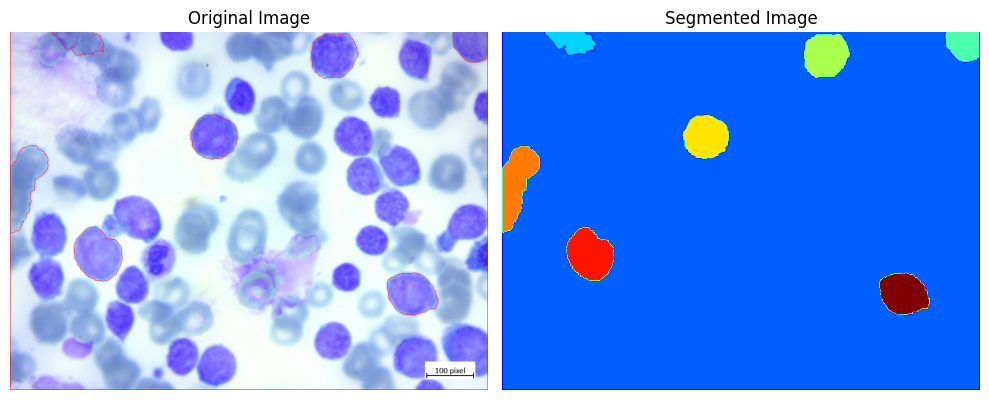

In [ ]:
import cv2
import numpy as np
import os
import random
from matplotlib import pyplot as plt


dataset_path = "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/"


image_files = os.listdir(dataset_path)

random_images = random.sample(image_files, 10)


for image_file in random_images:

    image_path = os.path.join(dataset_path, image_file)
    image = cv2.imread(image_path)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply adaptive thresholding to obtain a binary image
    _, thresholded = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Perform morphological operations to remove noise and fill gaps
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Apply distance transform to obtain the foreground regions. To
    # calculate the distance of each pixel from the nearest background pixel.
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    # Subtract the foreground regions from the background regions
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Apply connected component analysis to label the regions
    _, markers = cv2.connectedComponents(sure_fg)

    # Add 1 to all labels to ensure background is 1
    markers = markers + 1

    # Mark the unknown regions as 0
    markers[unknown == 255] = 0

    # Apply the watershed algorithm to segment the cells
    segmented = cv2.watershed(image, markers)
    image[segmented == -1] = [0, 0, 255]  # Mark the boundaries with red color

    # Display the original and segmented images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(segmented, cmap="jet")
    plt.title("Segmented Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:157: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:157: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  return func(*args, **kwargs)


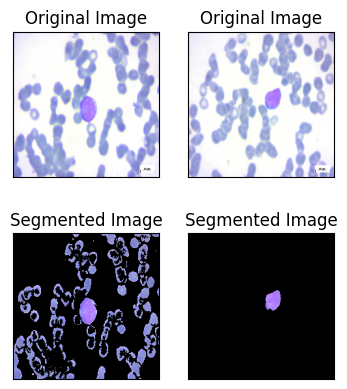

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage import morphology
from sklearn.cluster import KMeans
import random


data_list = [
    '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_007.jpg',
    '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_009.jpg',
]

# Number of images to process
n = 3

o_img = []
a_img = []
c_img = []
b_img = []
m_img = []
out_img = []

random.seed(865)
random.shuffle(data_list)

for img in data_list[:n]:
    i = cv2.imread(img)
    i = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
    i = cv2.resize(i, (224, 224))
    o_img.append(i)
    i_lab = cv2.cvtColor(i, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(i_lab)
    a_img.append(a)
    i2 = a.reshape(a.shape[0] * a.shape[1], 1)
    km = KMeans(n_clusters=7, random_state=0).fit(i2)
    p2s = km.cluster_centers_[km.labels_]
    ic = p2s.reshape(a.shape[0], a.shape[1])
    ic = ic.astype(np.uint8)
    c_img.append(ic)
    r, t = cv2.threshold(ic, 141, 255, cv2.THRESH_BINARY)
    b_img.append(t)
    fh = morphology.remove_small_objects(t, min_size=200)
    m1 = morphology.remove_small_holes(fh, area_threshold=250)
    m2 = m1.astype(np.uint8)
    m_img.append(m2)
    out = cv2.bitwise_and(i, i, mask=m2)
    out_img.append(out)

n = min(6, len(o_img))
for j in range(n):
    plt.subplot(2, 3, 1 + j), plt.imshow(o_img[j])
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(2, 3, 4 + j), plt.imshow(out_img[j])
    plt.title('Segmented Image'), plt.xticks([]), plt.yticks([])

plt.show()


# **Segmentation using Thresholding**

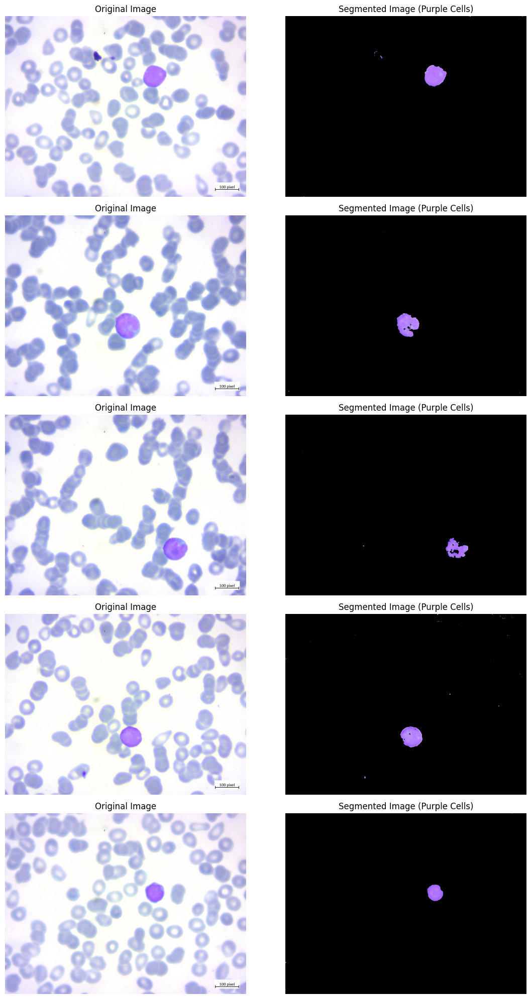

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


image_paths = [
    "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_004.jpg",
    "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_008.jpg",
    "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_010.jpg",
    "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_006.jpg",
    "/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_005.jpg"
]


fig, axes = plt.subplots(5, 2, figsize=(12, 20))


for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path)


    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the lower and upper thresholds for the purple color
    lower_purple = np.array([130, 50, 50])
    upper_purple = np.array([170, 255, 255])

    # Create a mask for the purple color
    mask = cv2.inRange(hsv, lower_purple, upper_purple)

    # Apply the mask to the original image
    segmented_image = cv2.bitwise_and(image, image, mask=mask)


    # Display the original image and the segmented image
    axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title('Segmented Image (Purple Cells)')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


# **Applying erosion and dilation**

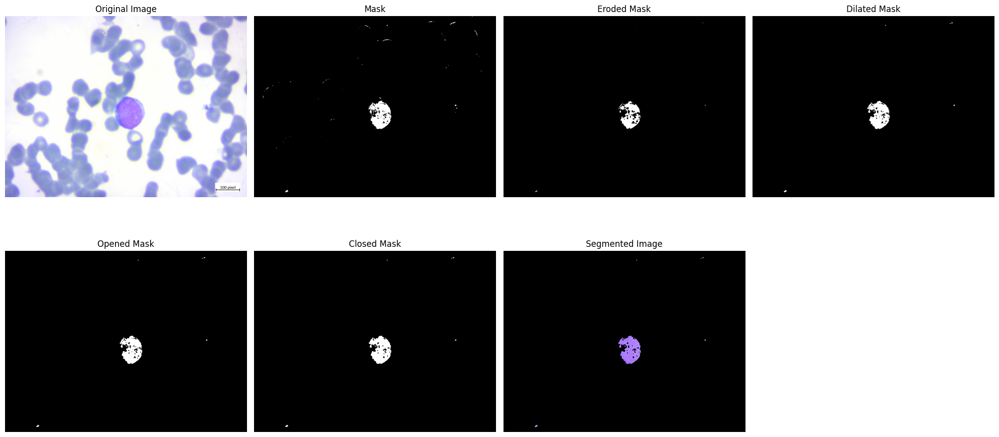

In [ ]:
# Adjusting the previous code to show the images after each morphological operation: erosion, dilation, opening, and closing.

image = cv2.imread('/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_007.jpg')

# Convert the image to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the lower and upper thresholds for the purple color
lower_purple = np.array([130, 50, 50])
upper_purple = np.array([170, 255, 255])

# Create a mask for the purple color
mask = cv2.inRange(hsv, lower_purple, upper_purple)

# Erosion and dilation kernel
kernel = np.ones((3,3), np.uint8)

# Perform erosion
mask_eroded = cv2.erode(mask, kernel, iterations=1)

# Perform dilation
mask_dilated = cv2.dilate(mask_eroded, kernel, iterations=1)

# Perform opening (erosion followed by dilation)
mask_opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

# Perform closing (dilation followed by erosion)
mask_closed = cv2.morphologyEx(mask_opened, cv2.MORPH_CLOSE, kernel)

# Apply the mask to the original image
segmented_image = cv2.bitwise_and(image, image, mask=mask_closed)

plt.figure(figsize=(20, 10))

titles = ['Original Image', 'Mask', 'Eroded Mask', 'Dilated Mask', 'Opened Mask', 'Closed Mask', 'Segmented Image']
images_to_show = [image, mask, mask_eroded, mask_dilated, mask_opened, mask_closed, segmented_image]

for i in range(7):
    plt.subplot(2, 4, i+1)
    if i == 0:
        plt.imshow(cv2.cvtColor(images_to_show[i], cv2.COLOR_BGR2RGB))
    elif i == 6:
        plt.imshow(cv2.cvtColor(images_to_show[i], cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(images_to_show[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()



# **Only dilation**

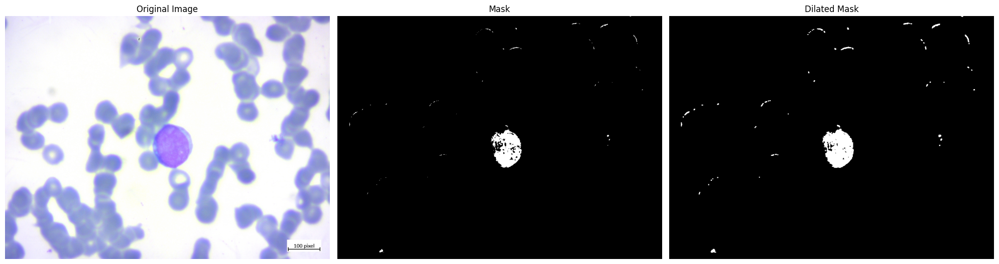

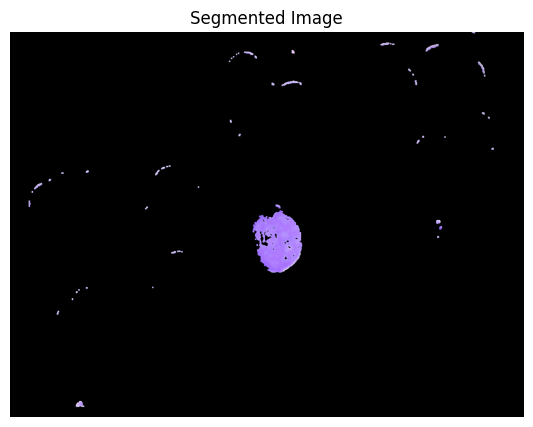

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

image_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_007.jpg'
image = cv2.imread(image_path)

# Convert the image to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the lower and upper thresholds for the purple color
lower_purple = np.array([130, 50, 50])
upper_purple = np.array([170, 255, 255])

# Create a mask for the purple color
mask = cv2.inRange(hsv, lower_purple, upper_purple)

# Dilation kernel
kernel_dilation = np.ones((3,3), np.uint8)

# Perform dilation to fill in gaps
mask_dilated = cv2.dilate(mask, kernel_dilation, iterations=1)

# Apply the dilated mask to the original image to segment the purple cells
segmented_image_only_dilated = cv2.bitwise_and(image, image, mask=mask_dilated)

# Display the original, mask, dilated mask, and segmented images using matplotlib
plt.figure(figsize=(20, 10))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Mask Image
plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

# Dilated Mask Image
plt.subplot(1, 3, 3)
plt.imshow(mask_dilated, cmap='gray')
plt.title('Dilated Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

# Segmented Image with only dilation
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(segmented_image_only_dilated, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image')
plt.axis('off')
plt.show()


**Adjusting kernel sizes and number of iterations**

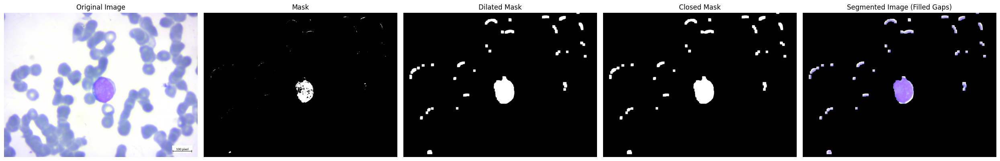

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


image_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_007.jpg'
image = cv2.imread(image_path)

# Convert the image to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the lower and upper thresholds for the purple color
lower_purple = np.array([130, 50, 50])
upper_purple = np.array([170, 255, 255])

# Create a mask for the purple color
mask = cv2.inRange(hsv, lower_purple, upper_purple)

# Dilation kernel - Increase the size for larger dilation
kernel_dilation = np.ones((5, 5), np.uint8)  # Larger kernel to fill more gaps

# Perform dilation to fill in gaps - Increase the number of iterations for more dilation
mask_dilated = cv2.dilate(mask, kernel_dilation, iterations=3)  # More iterations to fill larger gaps

# Closing kernel - It can be the same as the dilation kernel or different, based on your needs
kernel_closing = np.ones((5, 5), np.uint8)  # Same size kernel for closing

# Perform closing to fill in gaps - Dilation followed by erosion
mask_closed = cv2.morphologyEx(mask_dilated, cv2.MORPH_CLOSE, kernel_closing)

# Apply the closed mask to the original image to segment the purple cells
segmented_image_filled = cv2.bitwise_and(image, image, mask=mask_closed)

# Display the original, mask, dilated mask, closed mask, and segmented images using matplotlib
plt.figure(figsize=(25, 10))

# Original Image
plt.subplot(1, 5, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Mask Image
plt.subplot(1, 5, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

# Dilated Mask Image
plt.subplot(1, 5, 3)
plt.imshow(mask_dilated, cmap='gray')
plt.title('Dilated Mask')
plt.axis('off')

# Closed Mask Image
plt.subplot(1, 5, 4)
plt.imshow(mask_closed, cmap='gray')
plt.title('Closed Mask')
plt.axis('off')

# Segmented Image with Filled Gaps
plt.subplot(1, 5, 5)
plt.imshow(cv2.cvtColor(segmented_image_filled, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image (Filled Gaps)')
plt.axis('off')

plt.tight_layout()
plt.show()



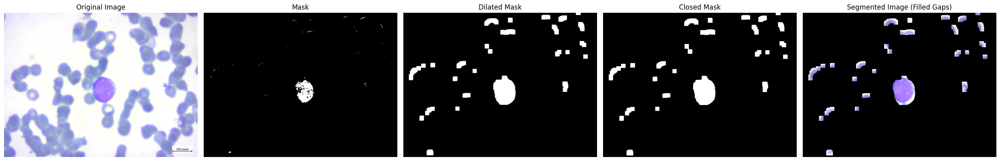

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


image_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_007.jpg'
image = cv2.imread(image_path)

# Convert the image to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the lower and upper thresholds for the purple color
lower_purple = np.array([130, 50, 50])
upper_purple = np.array([170, 255, 255])

# Create a mask for the purple color
mask = cv2.inRange(hsv, lower_purple, upper_purple)

# Dilation kernel - Increase the size for larger dilation
kernel_dilation = np.ones((8, 8), np.uint8)  # Larger kernel to fill more gaps

# Perform dilation to fill in gaps - Increase the number of iterations for more dilation
mask_dilated = cv2.dilate(mask, kernel_dilation, iterations=3)  # More iterations to fill larger gaps

# Closing kernel - It can be the same as the dilation kernel or different, based on your needs
kernel_closing = np.ones((8, 8), np.uint8)  # Same size kernel for closing

# Perform closing to fill in gaps - Dilation followed by erosion
mask_closed = cv2.morphologyEx(mask_dilated, cv2.MORPH_CLOSE, kernel_closing)

# Apply the closed mask to the original image to segment the purple cells
segmented_image_filled = cv2.bitwise_and(image, image, mask=mask_closed)

# Display the original, mask, dilated mask, closed mask, and segmented images using matplotlib
plt.figure(figsize=(25, 10))

# Original Image
plt.subplot(1, 5, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Mask Image
plt.subplot(1, 5, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

# Dilated Mask Image
plt.subplot(1, 5, 3)
plt.imshow(mask_dilated, cmap='gray')
plt.title('Dilated Mask')
plt.axis('off')

# Closed Mask Image
plt.subplot(1, 5, 4)
plt.imshow(mask_closed, cmap='gray')
plt.title('Closed Mask')
plt.axis('off')

# Segmented Image with Filled Gaps
plt.subplot(1, 5, 5)
plt.imshow(cv2.cvtColor(segmented_image_filled, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image (Filled Gaps)')
plt.axis('off')

plt.tight_layout()
plt.show()



**Erosion followed by dilation to remove noise**

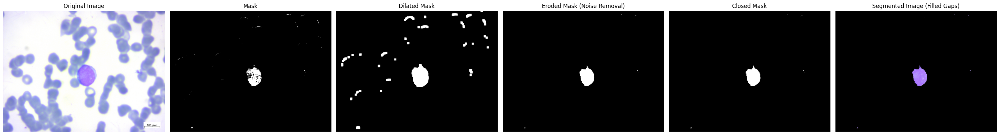

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


image_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B/Snap_007.jpg'
image = cv2.imread(image_path)

# Convert the image to HSV color space
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the lower and upper thresholds for the purple color
lower_purple = np.array([130, 50, 50])
upper_purple = np.array([170, 255, 255])

# Create a mask for the purple color
mask = cv2.inRange(hsv, lower_purple, upper_purple)

# Dilation kernel - Increase the size for larger dilation
kernel_dilation = np.ones((5, 5), np.uint8)  # Larger kernel to fill more gaps

# Perform dilation to fill in gaps - Increase the number of iterations for more dilation
mask_dilated = cv2.dilate(mask, kernel_dilation, iterations=3)  # More iterations to fill larger gaps

# Erosion kernel - Use a smaller kernel for erosion to remove noise
kernel_erosion = np.ones((8, 8), np.uint8)  # Smaller kernel for erosion

# Perform erosion to remove noise - Erosion followed by dilation
mask_eroded = cv2.morphologyEx(mask_dilated, cv2.MORPH_ERODE, kernel_erosion, iterations=2)

# Closing kernel - It can be the same as the dilation kernel or different, based on your needs
kernel_closing = np.ones((5, 5), np.uint8)  # Same size kernel for closing

# Perform closing to fill in gaps - Dilation followed by erosion
mask_closed = cv2.morphologyEx(mask_eroded, cv2.MORPH_CLOSE, kernel_closing)

# Apply the closed mask to the original image to segment the purple cells
segmented_image_filled = cv2.bitwise_and(image, image, mask=mask_closed)

# Display the original, mask, dilated mask, eroded mask, closed mask, and segmented images using matplotlib
plt.figure(figsize=(30, 10))

# Original Image
plt.subplot(1, 6, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Mask Image
plt.subplot(1, 6, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.axis('off')

# Dilated Mask Image
plt.subplot(1, 6, 3)
plt.imshow(mask_dilated, cmap='gray')
plt.title('Dilated Mask')
plt.axis('off')

# Eroded Mask Image
plt.subplot(1, 6, 4)
plt.imshow(mask_eroded, cmap='gray')
plt.title('Eroded Mask (Noise Removal)')
plt.axis('off')

# Closed Mask Image
plt.subplot(1, 6, 5)
plt.imshow(mask_closed, cmap='gray')
plt.title('Closed Mask')
plt.axis('off')

# Segmented Image with Filled Gaps
plt.subplot(1, 6, 6)
plt.imshow(cv2.cvtColor(segmented_image_filled, cv2.COLOR_BGR2RGB))
plt.title('Segmented Image (Filled Gaps)')
plt.axis('off')

plt.tight_layout()
plt.show()


**Performing the segmentation on Malignant Pre-B, Pro-B and early Pre-B folders**

In [ ]:
import cv2
import numpy as np
import os


folder_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B'
output_folder_path = '/content/Segmented-Malignant-Pre-B'
os.makedirs(output_folder_path, exist_ok=True)


def process_image(image_path):

    image = cv2.imread(image_path)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the lower and upper thresholds for the purple color
    lower_purple = np.array([130, 50, 50])
    upper_purple = np.array([170, 255, 255])

    # Create a mask for the purple color
    mask = cv2.inRange(hsv, lower_purple, upper_purple)

    # Dilation kernel - Increase the size for larger dilation
    kernel_dilation = np.ones((5, 5), np.uint8)  # Larger kernel to fill more gaps

    # Perform dilation to fill in gaps - Increase the number of iterations for more dilation
    mask_dilated = cv2.dilate(mask, kernel_dilation, iterations=3)  # More iterations to fill larger gaps

    # Erosion kernel - Use a smaller kernel for erosion to remove noise
    kernel_erosion = np.ones((8, 8), np.uint8)  # Smaller kernel for erosion

    # Perform erosion to remove noise - Erosion followed by dilation
    mask_eroded = cv2.morphologyEx(mask_dilated, cv2.MORPH_ERODE, kernel_erosion, iterations=2)

    # Closing kernel - It can be the same as the dilation kernel or different, based on your needs
    kernel_closing = np.ones((5, 5), np.uint8)  # Same size kernel for closing

    # Perform closing to fill in gaps - Dilation followed by erosion
    mask_closed = cv2.morphologyEx(mask_eroded, cv2.MORPH_CLOSE, kernel_closing)

    # Apply the closed mask to the original image to segment the purple cells
    segmented_image_filled = cv2.bitwise_and(image, image, mask=mask_closed)

    return segmented_image_filled

for filename in os.listdir(folder_path):
    if filename.endswith(".jpg"):
        image_path = os.path.join(folder_path, filename)
        processed_image = process_image(image_path)


        output_path = os.path.join(output_folder_path, filename)
        cv2.imwrite(output_path, processed_image)


**LAB**

In [ ]:
from imutils import paths
import os
import numpy as np
import random
import pandas as pd
import cv2
from sklearn.cluster import KMeans
import seaborn as sns
from scipy import ndimage as ndi
from skimage import morphology
import matplotlib.pyplot as plt



In [ ]:
data_dir  = '/content/Blood cell Cancer [ALL]'
data_list = sorted(list(paths.list_images(data_dir)))

In [ ]:
from imutils import paths


all_samples_path = '/content/Blood cell Cancer [ALL]'
benign_samples_path = '/content/Blood cell Cancer [ALL]/Benign'
earlypreb_samples_path = '/content/Blood cell Cancer [ALL]/[Malignant] early Pre-B'
preb_samples_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pre-B'
prob_samples_path = '/content/Blood cell Cancer [ALL]/[Malignant] Pro-B'

# Count the number of samples in each category
total_samples = len(list(paths.list_images(all_samples_path)))
benign_samples = len(list(paths.list_images(benign_samples_path)))
earlypreb_samples = len(list(paths.list_images(earlypreb_samples_path)))
preb_samples = len(list(paths.list_images(preb_samples_path)))
prob_samples = len(list(paths.list_images(prob_samples_path)))


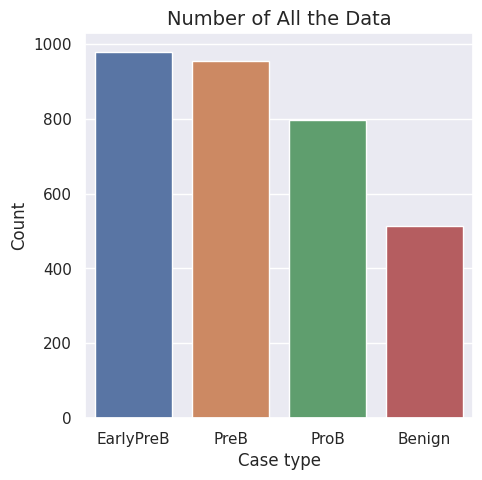

In [ ]:
sns.set(style="darkgrid")
plt.figure(figsize=(5,5))
sns.barplot(x= ['EarlyPreB','PreB','ProB','Benign'], y= [earlypreb_samples,preb_samples,prob_samples,benign_samples])
plt.title('Number of All the Data', fontsize=14)
plt.xlabel('Case type', fontsize=12)
plt.ylabel('Count', fontsize=12)
#plt.xticks(range(len(df.index)), ['a', 'b'])
plt.show()

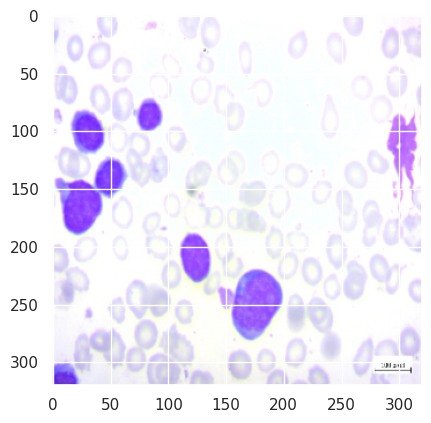

In [ ]:
l=[]
for img in data_list[:1]:
    image= cv2.imread(img)
    image= cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image= cv2.resize(image,(320,320))
    l.append(image)

for j in range(1):
    plt.imshow(l[j])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-17-ec2b9b71fc31>:64: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,3,1+t),plt.imshow(l1[j])


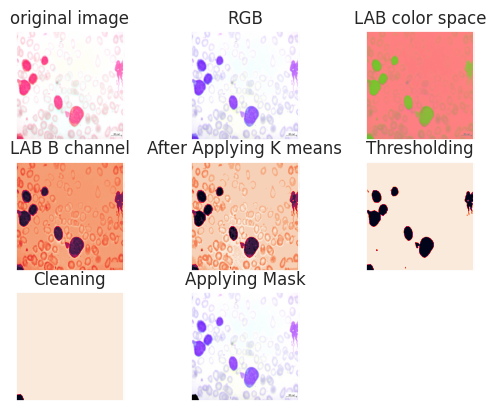

In [ ]:
# LAB B channel

l1=[]
rgb=[]
lab=[]
lab_l=[]
lab_a=[]
lab_b=[]
c_img=[]
cleaned=[]
final=[]
bin=[]

for img in data_list[:1]:

    image= cv2.imread(img)
    image= cv2.resize(image,(320,320))
    l1.append(image)

    imagergb= cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # imagergb= cv2.resize(imagergb,(320,320))
    rgb.append(imagergb)

    imagelab= cv2.cvtColor(imagergb, cv2.COLOR_RGB2LAB)
    # imagelab= cv2.resize(imagelab,(320,320))
    lab.append(imagelab)

    l,a,b = cv2.split(imagelab)
    lab_l.append(l)
    lab_a.append(a)
    lab_b.append(b)

    i2 = b.reshape(b.shape[0]*b.shape[1],1)
    km= KMeans(n_clusters=7, random_state=0).fit(i2)
    p2s= km.cluster_centers_[km.labels_]
    ic= p2s.reshape(b.shape[0],b.shape[1])
    ic = ic.astype(np.uint8)
    c_img.append(ic)

    r,t = cv2.threshold(ic,100,255 ,cv2.THRESH_BINARY)
    bin.append(t)

    fh = ndi.binary_fill_holes(t)
    m1 = morphology.remove_small_objects(fh, 200)
    m2 = morphology.remove_small_holes(m1,200)
    #m2 = ndi.binary_fill_holes(m2)
    #m1 = m1.astype(np.uint8)
    #m1_imgs.append(m1)
    m2 = m2.astype(np.uint8)
    # m3=cv2.bitwise_not(m2)
    cleaned.append(m2)

    out = cv2.bitwise_and(imagergb, imagergb, mask=m2)
    final.append(out)


for j in range(1):
    plt.imshow(final[j])


for j in range(1):
    for t in range(1):
        #print('=>',j+1,':')
        plt.subplot(3,3,1+t),plt.imshow(l1[j])
        plt.title('original image'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,2+t),plt.imshow(rgb[j])
        plt.title('RGB'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,3+t),plt.imshow(lab[j])
        plt.title('LAB color space'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,4+t),plt.imshow(lab_b[j])
        plt.title('LAB B channel'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,5+t),plt.imshow(c_img[j])
        plt.title('After Applying K means'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,6+t),plt.imshow(bin[j])
        plt.title('Thresholding'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,7+t),plt.imshow(cleaned[j])
        plt.title('Cleaning'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,8+t),plt.imshow(final[j])
        plt.title('Applying Mask'),plt.xticks([]),plt.yticks([])
    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-18-35528fe42840>:65: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,3,1+t),plt.imshow(l1[j])


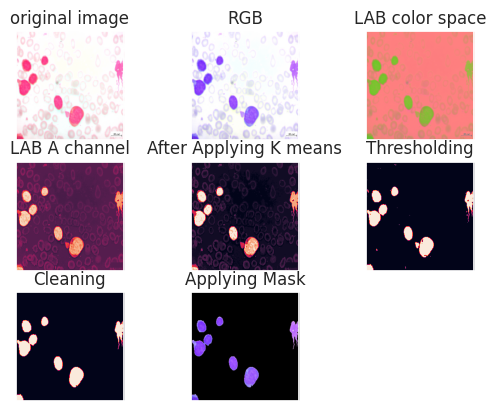

In [ ]:
# LAB A channel
l1=[]
rgb=[]
rgb_g=[]
lab=[]
lab_l=[]
lab_a=[]
lab_b=[]
c_img=[]
cleaned=[]
final=[]
bin=[]

for img in data_list[:1]:

    image= cv2.imread(img)
    image= cv2.resize(image,(320,320))
    l1.append(image)

    imagergb= cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # r,g,b=cvs.split(imagergb)
    # rgb_g.append(g)
    # imagergb= cv2.resize(imagergb,(320,320))
    rgb.append(imagergb)

    imagelab= cv2.cvtColor(imagergb, cv2.COLOR_RGB2LAB)
    # imagelab= cv2.resize(imagelab,(320,320))
    lab.append(imagelab)

    l,a,b = cv2.split(imagelab)
    lab_l.append(l)
    lab_a.append(a)
    lab_b.append(b)

    i2 = a.reshape(a.shape[0]*a.shape[1],1)
    km= KMeans(n_clusters=7, random_state=0).fit(i2)
    p2s= km.cluster_centers_[km.labels_]
    ic= p2s.reshape(a.shape[0],a.shape[1])
    ic = ic.astype(np.uint8)
    c_img.append(ic)

    r,t = cv2.threshold(ic,140,255 ,cv2.THRESH_BINARY)
    bin.append(t)

    fh = ndi.binary_fill_holes(t)
    m1 = morphology.remove_small_objects(fh, 200)
    m2 = morphology.remove_small_holes(m1,250)
    #m2 = ndi.binary_fill_holes(m2)
    #m1 = m1.astype(np.uint8)
    #m1_imgs.append(m1)
    m2 = m2.astype(np.uint8)
    cleaned.append(m2)

    out = cv2.bitwise_and(imagergb, imagergb, mask=m2)
    final.append(out)


for j in range(1):
    plt.imshow(final[j])


for j in range(1):
    for t in range(1):
        #print('=>',j+1,':')
        plt.subplot(3,3,1+t),plt.imshow(l1[j])
        plt.title('original image'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,2+t),plt.imshow(rgb[j])
        plt.title('RGB'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,3+t),plt.imshow(lab[j])
        plt.title('LAB color space'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,4+t),plt.imshow(lab_a[j])
        plt.title('LAB A channel'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,5+t),plt.imshow(c_img[j])
        plt.title('After Applying K means'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,6+t),plt.imshow(bin[j])
        plt.title('Thresholding'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,7+t),plt.imshow(cleaned[j])
        plt.title('Cleaning'),plt.xticks([]),plt.yticks([])
        plt.subplot(3,3,8+t),plt.imshow(final[j])
        plt.title('Applying Mask'),plt.xticks([]),plt.yticks([])
    plt.show()